In [15]:
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
import seaborn as sns
import streamlit as st

<h1>Streamlit</h1>

In [34]:
%%writefile app00.py
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import seaborn as sns
import streamlit as st
st.set_page_config(layout='wide')
df=pd.read_csv("heart_disease_ubdate.csv")
tab1 , tab2 , tab3 = st.tabs(["catigorical","numrical","dynamic"])
gender = st.sidebar.multiselect("Select gender",df["Gender"].unique(),default=df["Gender"].unique())
mask1 = df["Gender"].isin(gender)
##create table##
def create_responsive_table(data, title):
    table_fig = go.Figure(data=[go.Table(
        header=dict(
            values=list(data.columns),
            fill_color='navy',
            font=dict(color='white', size=12),
            align='center'
        ),
        cells=dict(
            values=[data[col] for col in data.columns],
            fill_color='lightgrey',
            font=dict(color='black',size=11),
            align='center'
        )
    )])
    table_fig.update_layout(
        width=400,  
        height=200,  
        margin=dict(l=0, r=0, t=0, b=0)  
    )
    return table_fig

#line of ages in sidebar
age_range = st.sidebar.slider(
    "select the age:",
    min_value=18,  
    max_value=80,  
    value=(18, 80),  
    step=1  
)
mask2 = df["Age"].between(age_range[0],age_range[1])
column_name1 = st.sidebar.multiselect("select columns analysis1",df.select_dtypes("O").columns,default=["Alcohol Consumption","Smoking"])
column_name2 = st.sidebar.multiselect("select columns analysis2",df.select_dtypes("O").columns,default=["Stress Level","Smoking"])
df_filter = df[mask1&mask2]
newdf =df
#fun to merge columns
def mix(columns):
    
    if len(columns) < 2:
        st.write("⚠️ Please select at least two columns to display the data.")
    
    
    combined_col = " & ".join(columns)
    newdf[combined_col] = newdf[list(columns)].astype(str).agg(" & ".join, axis=1)
    
   
    return px.histogram(
        data_frame=newdf,
        x=combined_col,
        y="Heart Disease Status",
        color="Age_Group",
        barmode="group"
    )

with tab1:
    col1,col2 = st.columns(2)
    with col1:
        st.plotly_chart(px.pie(data_frame=df_filter,names="Age_Group",values="Heart Disease Status",title="Heart Disease Status by Age Group"))
        
    with col2:
        age_group_counts = df_filter["Age_Group"].value_counts().reset_index()
        fig = ff.create_table(age_group_counts)
        st.plotly_chart(fig)
        fig1 = ff.create_table(df["Heart Disease Status"].value_counts().to_frame().T.rename(columns={0:"No heart disease",1:"heart disease sufferers"}))
        st.plotly_chart(fig1)
    st.plotly_chart(px.pie(data_frame=df_filter,names="Smoking",values="Heart Disease Status",facet_col="Age_Group",hole=.4,title="Heart Disease Status by Smoking and Age Group"))
    col3,col4 = st.columns(2)
    mask = df["Smoking"]=="Yes"
    with col3:
        fig3=ff.create_table(pd.pivot_table(data=df_filter[mask],index="Gender",values="Smoking",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False).head(1))
        st.plotly_chart(fig3)
    with col4:
        fig4=ff.create_table(pd.pivot_table(data=df_filter[mask],index="Age_Group",values="Smoking",aggfunc="count").reset_index().sort_values(by=["Age_Group"],ascending=False).head(1))
        st.plotly_chart(fig4)
   
    
    
    st.plotly_chart(px.pie(data_frame=df_filter[mask],names="Alcohol Consumption",values="Heart Disease Status",facet_col="Age_Group",hole=.4,title="Heart Disease Status by Alcohol and Age Group"))
    col5,col6,col7 = st.columns(3)
    mask = df["Alcohol Consumption"]=="High"
    mask2=df["Alcohol Consumption"]=="Medium"
    mask3=df["Alcohol Consumption"]=="Low"
    with col5:
        fig3=create_responsive_table(pd.pivot_table(data=df_filter[mask],index="Gender",values="Alcohol Consumption",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False).rename(columns={"Alcohol Consumption":"Alcohol Consumption(H)"}),"High Consumption")
        st.plotly_chart(fig3,use_container_width=True)
    with col6:
        fig4=create_responsive_table(pd.pivot_table(data=df_filter[mask2],index="Gender",values="Alcohol Consumption",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False).rename(columns={"Alcohol Consumption":"Alcohol Consumption(M)"}),"medium Consumption")
        st.plotly_chart(fig4,use_container_width=True)
    with col7:
        fig5=create_responsive_table(pd.pivot_table(data=df_filter[mask3],index="Gender",values="Alcohol Consumption",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False).rename(columns={"Alcohol Consumption":"Alcohol Consumption(L)"}),"low Consumption")
        st.plotly_chart(fig5,use_container_width=True)


    
    st.plotly_chart(px.pie(data_frame=df_filter,names="Stress Level",values="Heart Disease Status",facet_col="Age_Group",hole=.4,title="Heart Disease Status by Stress Level and Age Group") )
    col8,col9,col10 = st.columns(3)
    mask4 = df["Stress Level"]=="High"
    mask5=df["Stress Level"]=="Medium"
    mask6=df["Stress Level"]=="Low"
    with col8:
        fig6=create_responsive_table(pd.pivot_table(data=df_filter[mask4],index="Gender",values="Stress Level",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False).rename(columns={"Stress Level":"Stress Level(H)"}),"Stress Level H")
        st.plotly_chart(fig6,use_container_width=True)
    with col9:
        fig7=create_responsive_table(pd.pivot_table(data=df_filter[mask5],index="Gender",values="Stress Level",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False).rename(columns={"Stress Level":"Stress Level(M)"}),"Stress Level M")
        st.plotly_chart(fig7,use_container_width=True)
    with col10:
        fig8=create_responsive_table(pd.pivot_table(data=df_filter[mask6],index="Gender",values="Stress Level",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False).rename(columns={"Stress Level":"Stress Level(L)"}),"Stress Level L")
        st.plotly_chart(fig8,use_container_width=True)

    st.plotly_chart(px.pie(data_frame=df_filter,names="Exercise Habits",values="Heart Disease Status",facet_col="Age_Group",hole=.4,title="Heart Disease Status by Exercise Habits and Age Group") )
    
    
    st.plotly_chart(px.pie(data_frame=df_filter,names="Diabetes",values="Heart Disease Status",facet_col="Age_Group",hole=.4,title="Heart Disease Status by Diabetes and Age Group"))
    col11,col12=st.columns(2)
    with col11:
        st.plotly_chart(px.line(data_frame=df.sample(n=100, random_state=30).sort_index() ,y="Triglyceride Level",color="Diabetes",markers=True,color_discrete_sequence=["red","green"],title="Diabetes and Triglyceride Level"))
    with col12:
        st.markdown("<p style='margin-top: 10%;'>Number of diabetics of each gender</p>",unsafe_allow_html=True)
        fig9=ff.create_table(pd.pivot_table(data=df,index="Gender",values="Diabetes",aggfunc="count").T.reset_index().drop(["index"],axis=1)) 
        st.plotly_chart(fig9,use_container_width=True)
        
    st.plotly_chart(px.pie(data_frame=df_filter,names="High Blood Pressure",values="Heart Disease Status",facet_col="Age_Group",hole=.4,title="Heart Disease Status by High Blood Pressure and Age Group"))
    st.plotly_chart(px.histogram(data_frame=df,x="Sugar Consumption",y="Heart Disease Status",color="Age_Group",barmode="group",text_auto=True,title="Heart Disease Status by Sugar Consumption and Age Group"))
    col13,col14 = st.columns(2)
    with col13:
        st.plotly_chart(px.histogram(data_frame=df,x="Low HDL Cholesterol",y="Heart Disease Status",color="Age_Group",barmode="group",text_auto=True,title="Heart Disease Status by Low HDL Cholesterol and Age Group"))
        st.plotly_chart(px.histogram(data_frame=df_filter,x="Family Heart Disease",y="Heart Disease Status",title="Heart Disease Status by Family Heart Disease and Age Group"))
    with col14:
        st.plotly_chart(px.histogram(data_frame=df,x="High LDL Cholesterol",y="Heart Disease Status",color="Age_Group",barmode="group",text_auto=True,title="Heart Disease Status by High LDL Cholesterol and Age Group"))
        st.plotly_chart(px.histogram(data_frame=df,x="Exercise Habits",y="Heart Disease Status",title="Heart Disease Status by Exercise Habits"))
with tab2:
    col1,col2 = st.columns(2)
    with col1:
        st.plotly_chart(px.box(data_frame=df, x='Age_Group', y='Blood Pressure',color='Heart Disease Status',title="Heart Disease Status by Blood Pressure and Age Group"))
        st.plotly_chart(px.box(data_frame=df, x='Age_Group', y='BMI', color='Heart Disease Status',title="Heart Disease Status by BMI and Age Group"))
        st.plotly_chart(px.box(data_frame=df, x='Age_Group', y='CRP Level', color='Heart Disease Status',title="Heart Disease Status by CRP Level and Age Group"))
        st.plotly_chart(px.box(data_frame=df, x='Age_Group', y='Homocysteine Level', color='Heart Disease Status',title="Heart Disease Status by Homocysteine Level and Age Group"))
   
    with col2:
        st.markdown("<p style='margin-top: 10%;'>Heart Disease Status by Age_Group</p>",unsafe_allow_html=True)
        fig10=ff.create_table(pd.pivot_table(data=df,index="Age_Group",values="Heart Disease Status",aggfunc="sum").reset_index())
        st.plotly_chart(fig10,use_container_width=True)
        st.markdown("<p style='margin-top: 27%;'></p>",unsafe_allow_html=True)
        st.plotly_chart(px.box(data_frame=df, x='Age_Group', y='Cholesterol Level', color='Heart Disease Status',title="Heart Disease Status by Cholesterol Level and Age Group"))
        st.plotly_chart(px.box(data_frame=df, x='Age_Group', y='Sleep Hours', color='Heart Disease Status',title="Heart Disease Status by Sleep Hours and Age Group"))
        st.plotly_chart(px.box(data_frame=df, x='Age_Group', y='Triglyceride Level', color='Heart Disease Status',title="Heart Disease Status by Triglyceride Level and Age Group"))
        st.plotly_chart(px.box(data_frame=df, x='Age_Group', y='Fasting Blood Sugar', color='Heart Disease Status',title="Heart Disease Status by Fasting Blood Sugar and Age Group"))
    


with tab3:
    col1,col2 = st.columns(2)
    with col1:
        st.plotly_chart(mix(column_name1))
    with col2:
        st.plotly_chart(mix(column_name2))
    

Overwriting app00.py


In [35]:
! streamlit run app00.py

^C


<h1>read New Data</h1>

In [16]:
df=pd.read_csv("heart_disease_ubdate.csv")
df

,Unnamed: 0,Age,Gender,Blood Pressure,Cholesterol Level,Exercise Habits,Smoking,Family Heart Disease,Diabetes,BMI,...,Alcohol Consumption,Stress Level,Sleep Hours,Sugar Consumption,Triglyceride Level,Fasting Blood Sugar,CRP Level,Homocysteine Level,Heart Disease Status,Age_Group
0,0,56.0,Male,153.0,155.0,High,Yes,Yes,No,24.991591,...,High,Medium,7.633228,Medium,342.0,130.666667,12.969246,12.387250,0,50-59
1,1,69.0,Female,146.0,286.0,High,No,Yes,Yes,25.221799,...,Medium,High,8.744034,Medium,133.0,157.000000,9.355389,19.298875,0,60-80
2,2,46.0,Male,126.0,216.0,Low,No,No,No,29.855447,...,Low,Low,4.440440,Low,393.0,92.000000,12.709873,11.230926,0,40-49
3,3,32.0,Female,122.0,293.0,High,Yes,Yes,No,24.130477,...,Low,High,5.249405,High,293.0,94.000000,12.509046,5.961958,0,30-39
4,4,60.0,Male,166.0,242.0,Low,Yes,Yes,Yes,20.486289,...,Low,High,7.030971,High,263.0,154.000000,10.381259,8.153887,0,60-80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9976,9995,25.0,Female,136.0,243.0,Medium,Yes,No,No,18.788791,...,Medium,High,6.834954,Medium,343.0,133.000000,3.588814,19.132004,1,18-29
9977,9996,38.0,Male,172.0,154.0,Medium,No,No,No,31.856801,...,Medium,High,8.247784,Low,377.0,83.000000,2.658267,9.715709,1,30-39
9978,9997,73.0,Male,152.0,201.0,High,Yes,No,Yes,26.899911,...,Low,Low,4.436762,Low,248.0,88.000000,4.408867,9.492429,1,60-80
9979,9998,23.0,Male,142.0,299.0,Low,Yes,No,Yes,34.964026,...,Medium,High,8.526329,Medium,113.0,153.000000,7.215634,11.873486,1,18-29


## 1-Heart Disease Status by Age Group

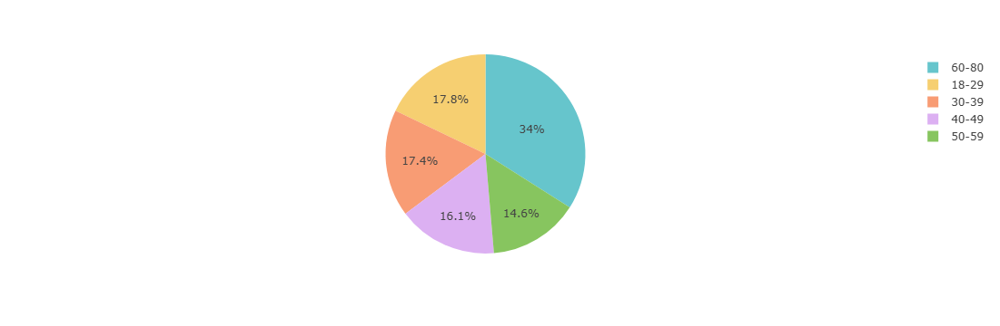

In [19]:
px.pie(data_frame=df,names="Age_Group",values="Heart Disease Status",color_discrete_sequence=px.colors.qualitative.Pastel)

<h1>2-Heart Disease Status by Smoking and Age Group</h1>

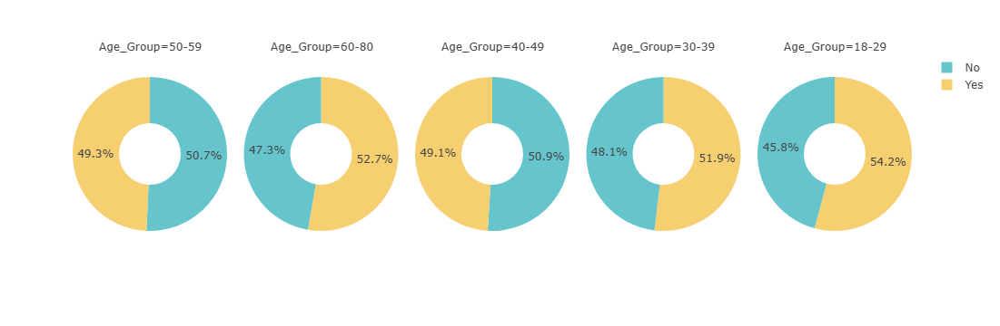

In [29]:
px.pie(data_frame=df,names="Smoking",values="Heart Disease Status",facet_col="Age_Group",hole=.4,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 3-Heart Disease Status by Alcohol Consumption and Age Group

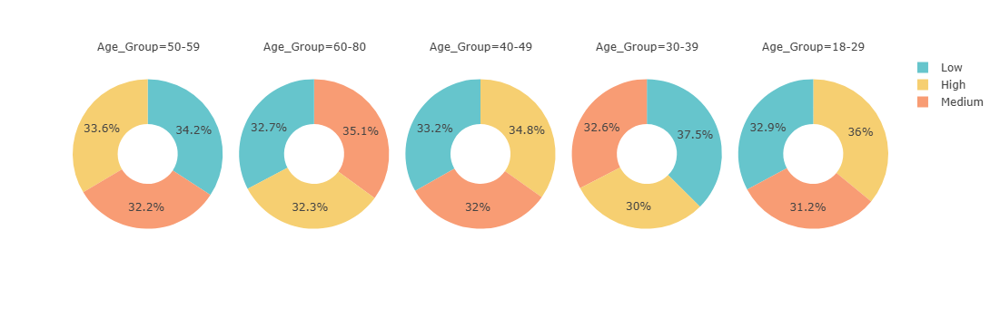

In [21]:
px.pie(data_frame=df,names="Alcohol Consumption",values="Heart Disease Status",facet_col="Age_Group",hole=.4,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 4-Heart Disease Status by Stress Level and Age Group

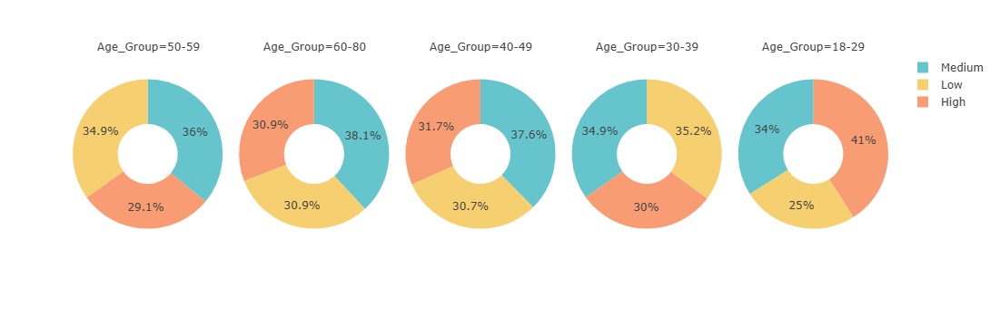

In [22]:
px.pie(data_frame=df,names="Stress Level",values="Heart Disease Status",facet_col="Age_Group",hole=.4,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 5-Heart Disease Status by Family Heart Disease and Age Group

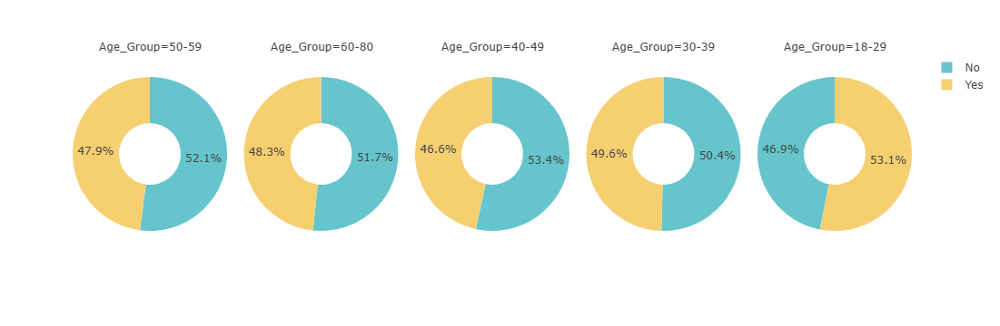

In [23]:
px.pie(data_frame=df,names="Family Heart Disease",values="Heart Disease Status",facet_col="Age_Group",hole=.4,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 6-Heart Disease Status by Exercise Habits and Age Group

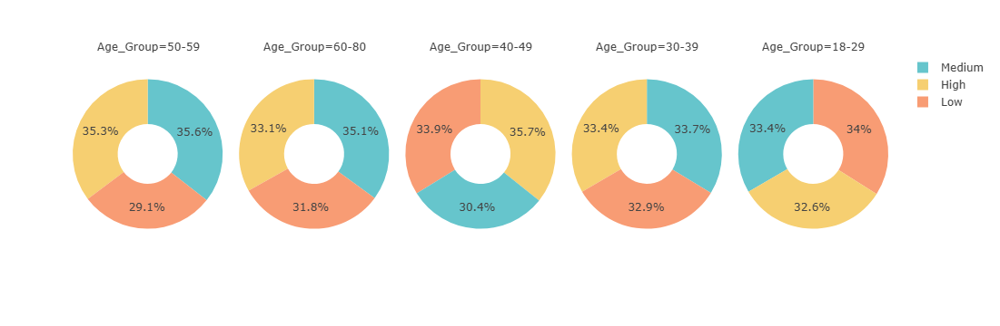

In [24]:
px.pie(data_frame=df,names="Exercise Habits",values="Heart Disease Status",facet_col="Age_Group",hole=.4,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 7-Heart Disease Status by Diabetes and Age Group

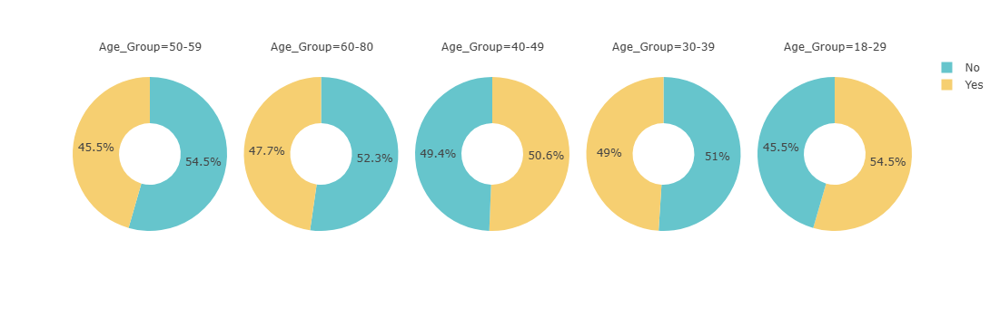

In [25]:
px.pie(data_frame=df,names="Diabetes",values="Heart Disease Status",facet_col="Age_Group",hole=.4,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 8-Heart Disease Status by High Blood Pressure and Age Group

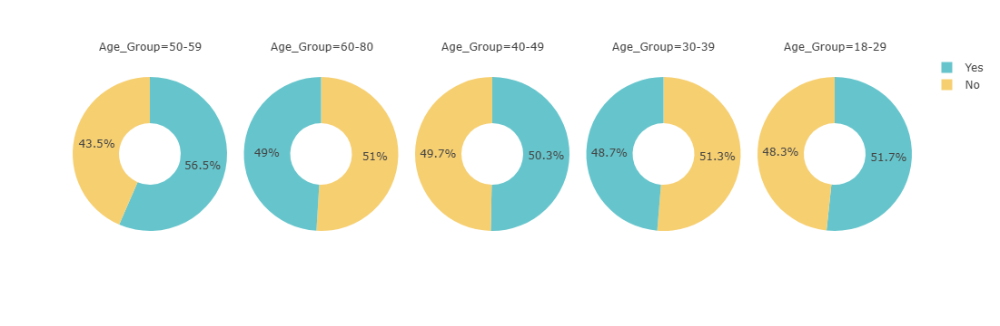

In [26]:
px.pie(data_frame=df,names="High Blood Pressure",values="Heart Disease Status",facet_col="Age_Group",hole=.4,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 9-Heart Disease Status by Sugar Consumption and Age Group

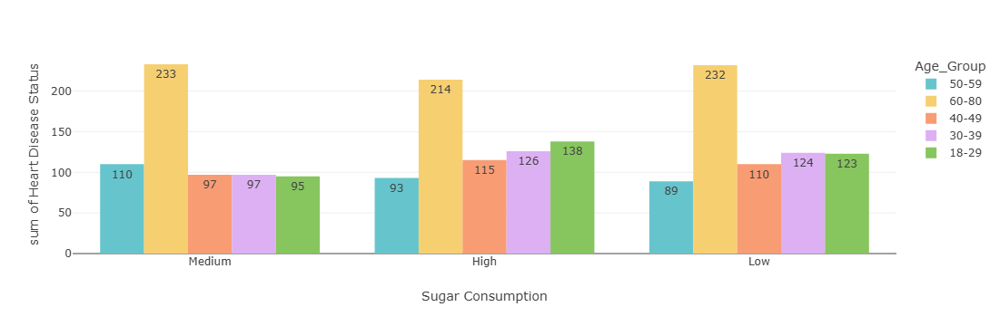

In [31]:
px.histogram(data_frame=df,x="Sugar Consumption",y="Heart Disease Status",color="Age_Group",barmode="group",text_auto=True,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 10-Heart Disease Status by Low HDL Cholesterol and Age Group

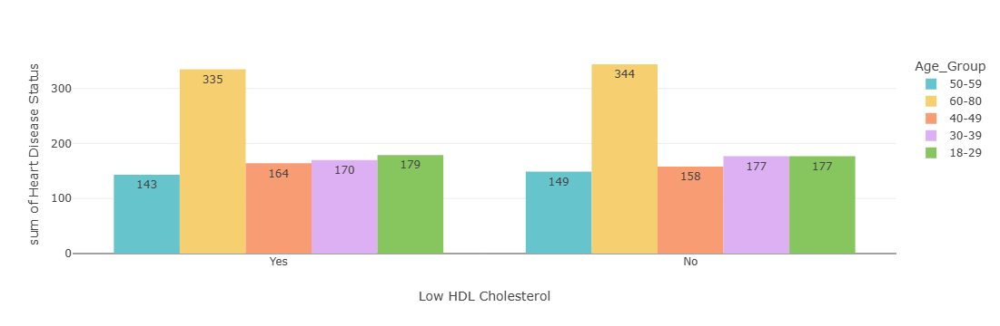

In [32]:
px.histogram(data_frame=df,x="Low HDL Cholesterol",y="Heart Disease Status",color="Age_Group",barmode="group",text_auto=True,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 11-Heart Disease Status by High LDL Cholesterol and Age Group

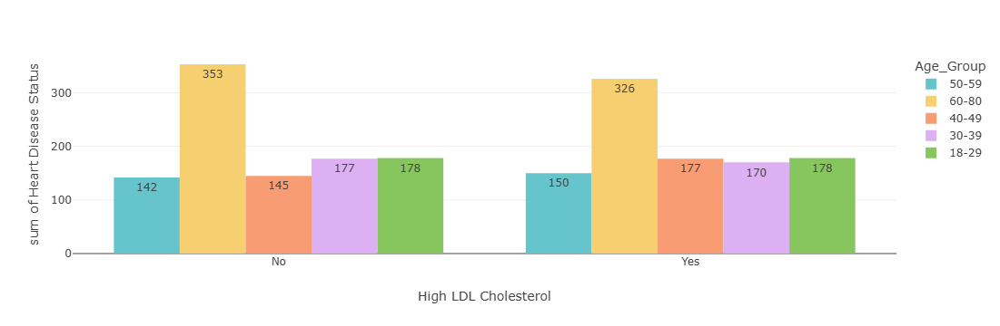

In [33]:
px.histogram(data_frame=df,x="High LDL Cholesterol",y="Heart Disease Status",color="Age_Group",barmode="group",text_auto=True,color_discrete_sequence=px.colors.qualitative.Pastel) 

## 12-Heart Disease Status by Blood Pressure and Age Group

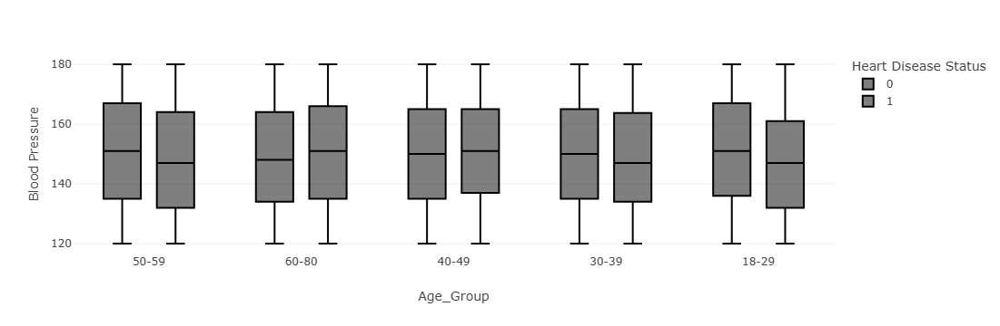

In [111]:
px.box(data_frame=df, x='Age_Group', y='Blood Pressure',color='Heart Disease Status')

In [126]:
pd.pivot_table(data=df,index="Age_Group",values="Heart Disease Status",aggfunc="sum").reset_index()

,Age_Group,Heart Disease Status
0,18-29,356
1,30-39,347
2,40-49,322
3,50-59,292
4,60-80,679


## 13-Heart Disease Status by BMI and Age Group

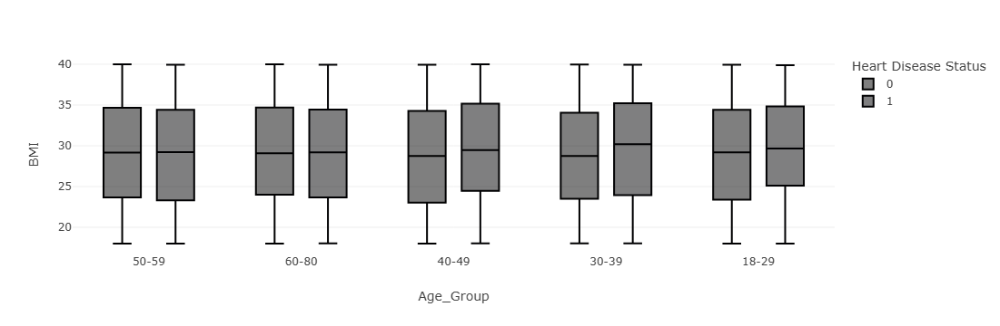

In [54]:
px.box(data_frame=df, x='Age_Group', y='BMI', color='Heart Disease Status')

## 14-Heart Disease Status by Cholesterol Level and Age Group

In [55]:
px.box(data_frame=df, x='Age_Group', y='Cholesterol Level', color='Heart Disease Status')

## 13-Heart Disease Status by Sleep Hours and Age Group

In [56]:
px.box(data_frame=df, x='Age_Group', y='Sleep Hours', color='Heart Disease Status')

## 14-Heart Disease Status by Triglyceride Level and Age Group

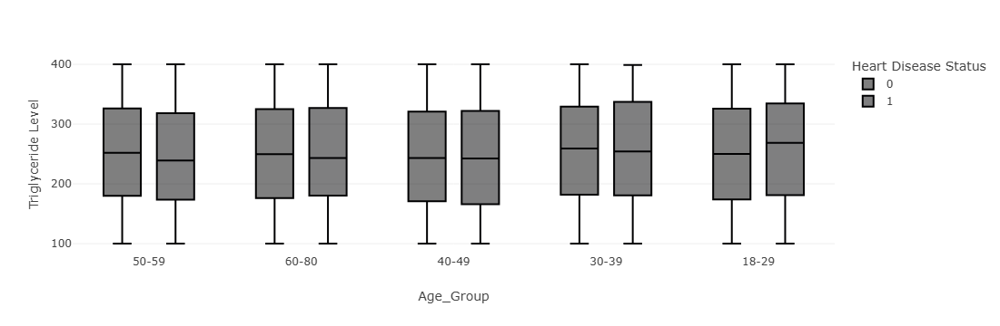

In [57]:
px.box(data_frame=df, x='Age_Group', y='Triglyceride Level', color='Heart Disease Status')

## 15-Heart Disease Status by CRP Level and Age Group

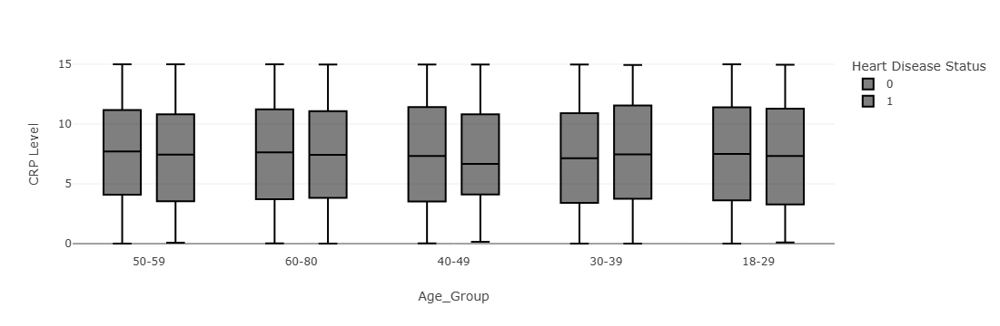

In [58]:
px.box(data_frame=df, x='Age_Group', y='CRP Level', color='Heart Disease Status')

## 16-Heart Disease Status by Fasting Blood Sugar and Age Group

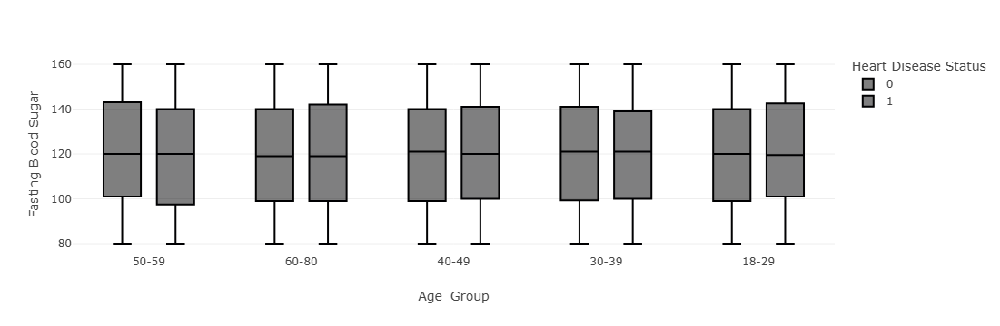

In [59]:
px.box(data_frame=df, x='Age_Group', y='Fasting Blood Sugar', color='Heart Disease Status')

## 17-Heart Disease Status by Homocysteine Level and Age Group

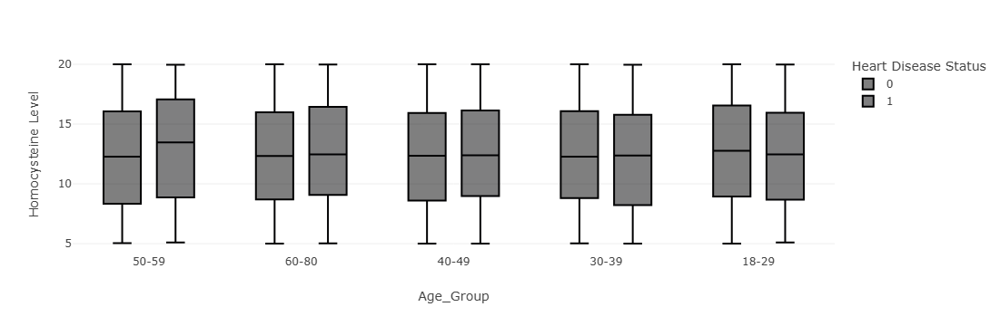

In [60]:
px.box(data_frame=df, x='Age_Group', y='Homocysteine Level', color='Heart Disease Status')

In [63]:
df["Age_Group"].value_counts()

Age_Group
60-80    3413
18-29    1823
30-39    1614
40-49    1584
50-59    1547
Name: count, dtype: int64

## 18-fun dynamic analysis to merge many columns

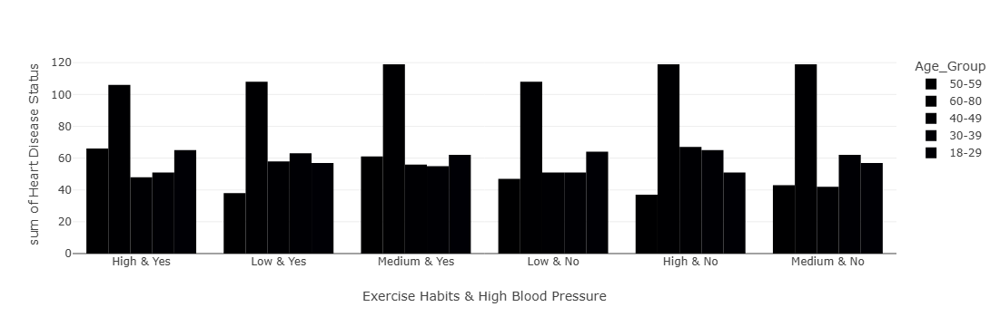

In [67]:
def mix(columns):

    newdf =df
    # دمج الأعمدة المطلوبة باستخدام "&"
    combined_col = " & ".join(columns)
    newdf[combined_col] = newdf[list(columns)].astype(str).agg(" & ".join, axis=1)
    
    # إنشاء الرسم باستخدام الأعمدة الديناميكية
    return px.histogram(
        data_frame=newdf,
        x=combined_col,
        y="Heart Disease Status",
        color="Age_Group",
        barmode="group"
    )
mix(["Exercise Habits","High Blood Pressure"])

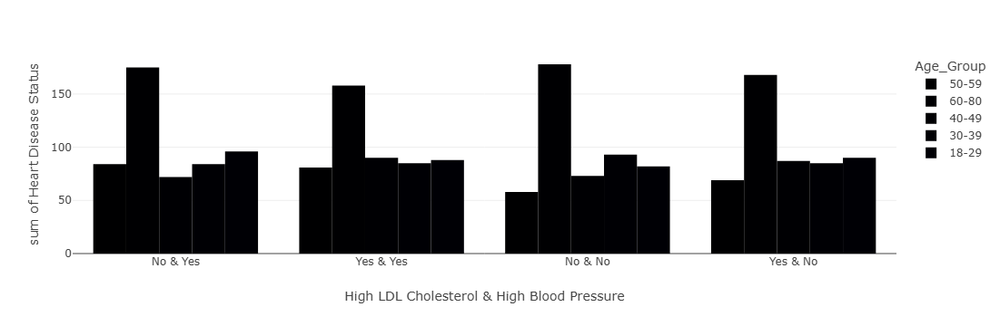

In [72]:
mix(["High LDL Cholesterol","High Blood Pressure"])

## No heart disease and	heart disease sufferers

In [73]:
df["Heart Disease Status"].value_counts().to_frame().T.rename(columns={0:"No heart disease",1:"heart disease sufferers"})

Heart Disease Status,No heart disease,heart disease sufferers
count,7985,1996


## Alcohol Consumption(High)

In [75]:
mask = df["Alcohol Consumption"]=="High"
pd.pivot_table(data=df[mask],index="Gender",values="Alcohol Consumption",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False).rename(columns={"Alcohol Consumption":"Alcohol Consumption(High)"})

,Gender,Alcohol Consumption(High)
1,Male,1271
0,Female,1152


## Alcohol Consumption(Medium)

In [76]:
mask = df["Alcohol Consumption"]=="Medium"
pd.pivot_table(data=df[mask],index="Gender",values="Alcohol Consumption",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False)

,Gender,Alcohol Consumption
1,Male,2497
0,Female,2578


## Alcohol Consumption(Low)

In [77]:
mask = df["Alcohol Consumption"]=="Low"
pd.pivot_table(data=df[mask],index="Gender",values="Alcohol Consumption",aggfunc="count").reset_index().sort_values(by=["Gender"],ascending=False)

,Gender,Alcohol Consumption
1,Male,1248
0,Female,1235


## Most smoking age group

In [78]:
pd.pivot_table(data=df,index="Age_Group",values="Smoking",aggfunc="count").reset_index().sort_values(by=["Age_Group"],ascending=False).head(1)

,Age_Group,Smoking
4,60-80,3413


## Stress Level (High)

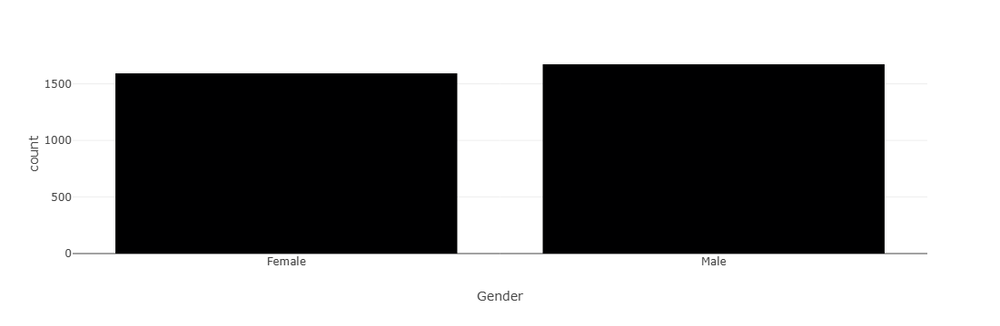

In [80]:
mask = df["Stress Level"]=="High"
px.histogram(data_frame=df[mask],y="Stress Level",x="Gender",histfunc="count")

## Stress Level (Medium)

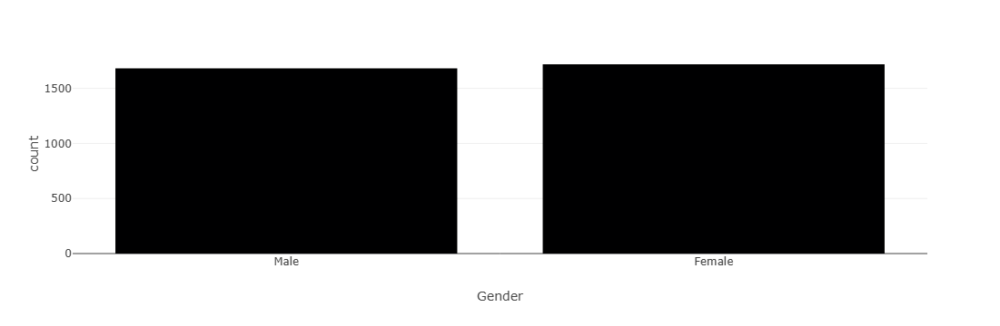

In [81]:
mask = df["Stress Level"]=="Medium"
px.histogram(data_frame=df[mask],y="Stress Level",x="Gender",histfunc="count")

## Exercise Habits (High)

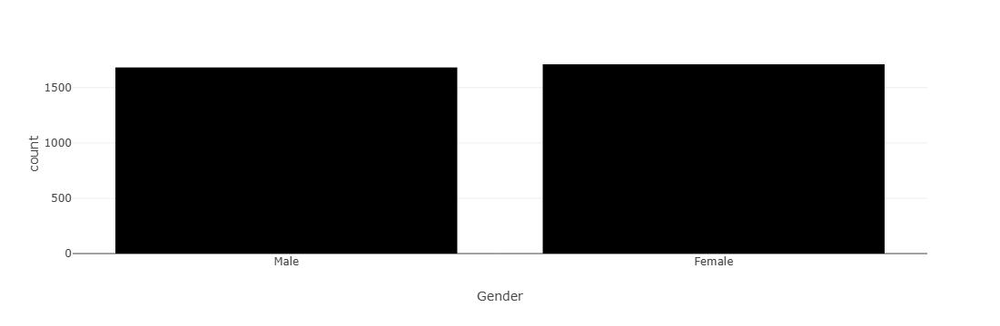

In [84]:
mask = df["Exercise Habits"]=="High"
px.histogram(data_frame=df[mask],y="Exercise Habits",x="Gender",histfunc="count")

## Exercise Habits (Medium)

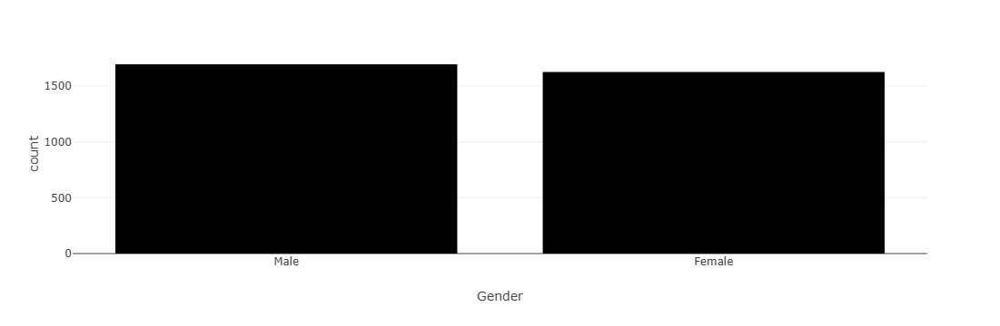

In [85]:
mask = df["Exercise Habits"]=="Medium"
px.histogram(data_frame=df[mask],y="Exercise Habits",x="Gender",histfunc="count")

## Exercise Habits (Low)

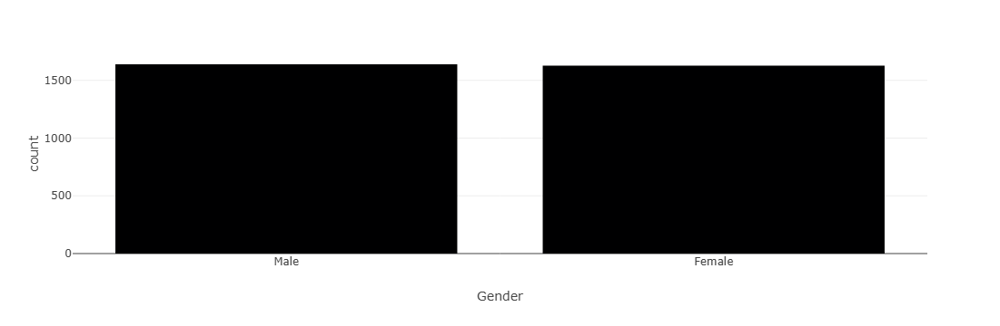

In [86]:
mask = df["Exercise Habits"]=="Low"
px.histogram(data_frame=df[mask],y="Exercise Habits",x="Gender",histfunc="count")

## count of Exercise Habits

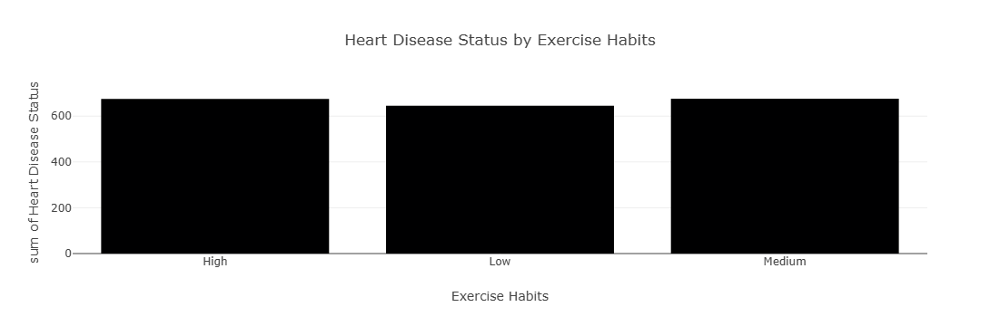

In [90]:
px.histogram(data_frame=df,x="Exercise Habits",y="Heart Disease Status",title="Heart Disease Status by Exercise Habits")

## Diabetes and Triglyceride Level

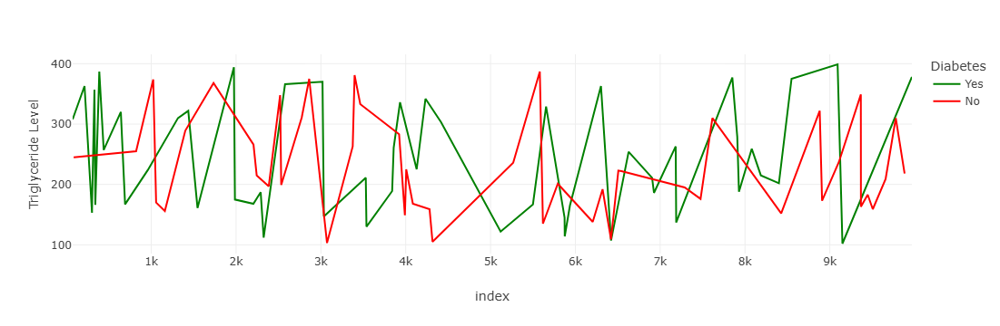

In [89]:
px.line(data_frame=df.sample(n=100, random_state=30).sort_index() ,y="Triglyceride Level",color="Diabetes",markers=True,color_discrete_sequence=["red","green"],title="Diabetes and Triglyceride Level")

In [98]:
pd.pivot_table(data=df,index="Gender",values="Diabetes",aggfunc="count")

,Diabetes
Gender,
Female,4965
Male,5016


## Blood Pressure and High Blood Pressure

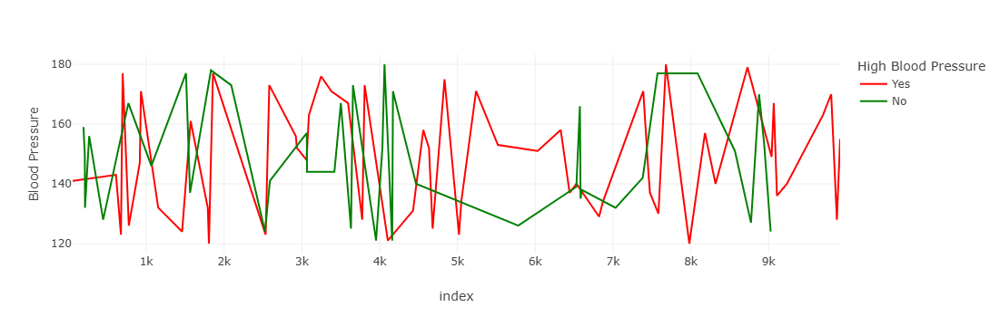

In [97]:
px.line(data_frame=df.sample(n=100, random_state=10).sort_index(),y="Blood Pressure",color="High Blood Pressure",color_discrete_sequence=["red","green"])